# Wstęp do Multimediów - Laboratorum 4
## Kamil Jaworski, nr indeksu 335201

## Zad. 1

Zrealizować operację filtracji barwnego obrazu cyfrowego.
Do realizacji zadania wykorzystać obrazy zaszumione (szumem gaussowskim oraz impulsowym).
Każdy z obrazów wejściowych poddać przetwarzaniu filtrem wygładzającym (Gaussa) i filtrem
medianowym. Każdy obraz wynikowy wyświetlić i obliczyć dla niego PSNR (w stosunku do obrazu
oryginalnego, nie zaszumionego!, funkcja do obliczania PSNR dostępna jest w przykładowym
skrypcie). Ocenić działanie filtrów dla masek o rozmiarach: 3x3, 5x5, 7x7.
Zebrać w tabeli PSNR dla różnych rodzajów szumów, filtrów i rozmiarów maski.

In [36]:
import numpy as np
import matplotlib as plt
import cv2

Numer_indeksu % liczba_zdjęć = x

In [37]:
nr_zdj = 335201 % 36
print("numer zdjęcia po losowaniu: ", nr_zdj)

numer zdjęcia po losowaniu:  5


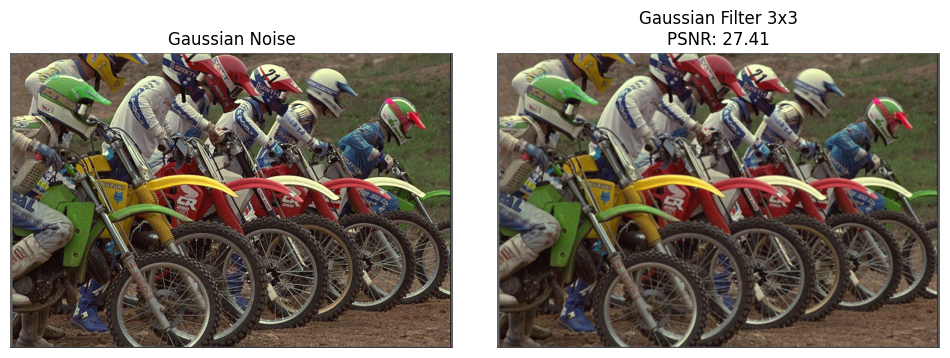

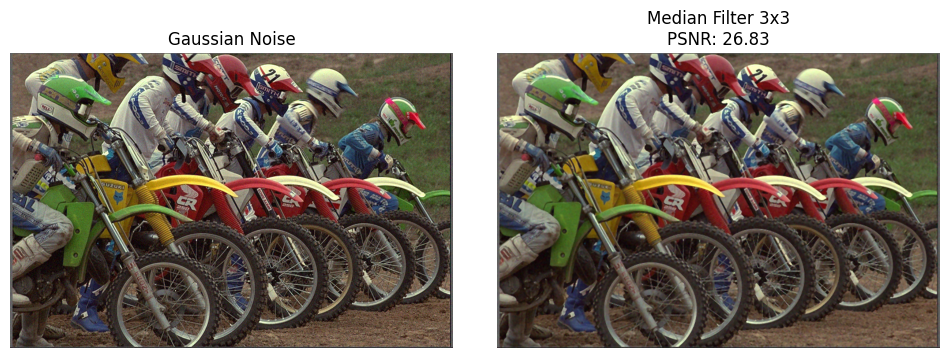

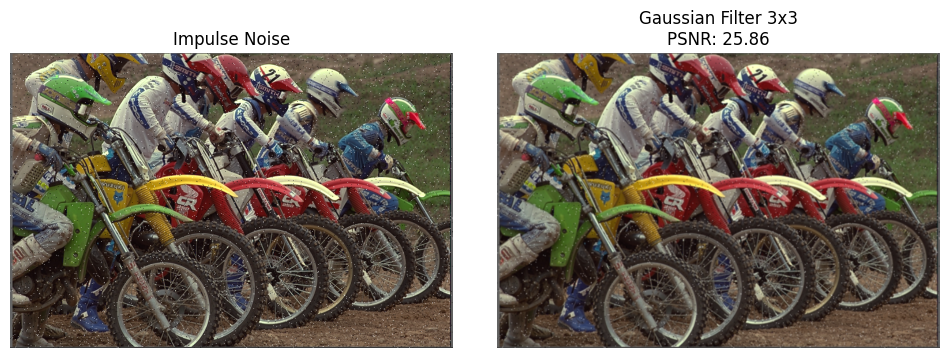

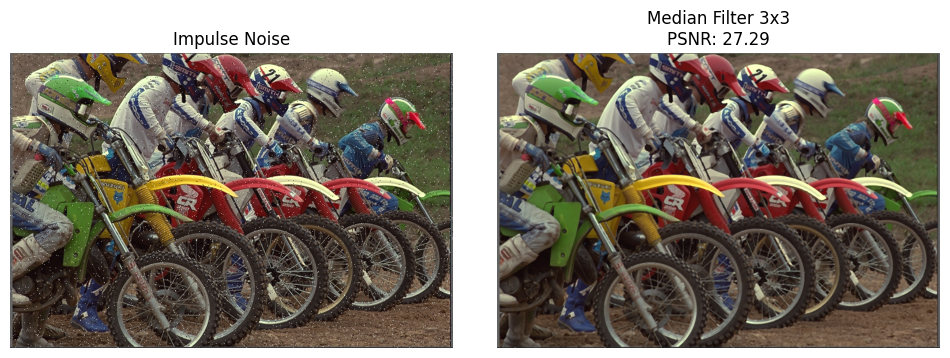

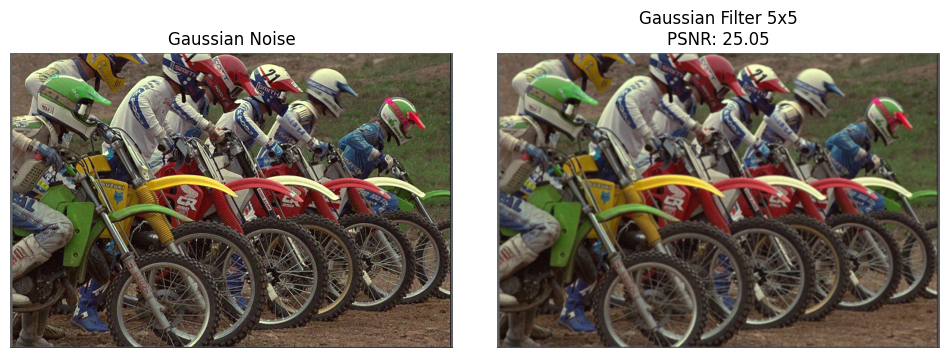

...

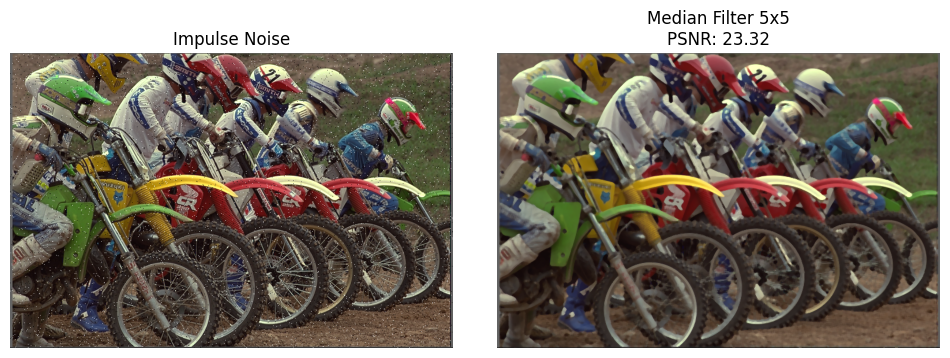

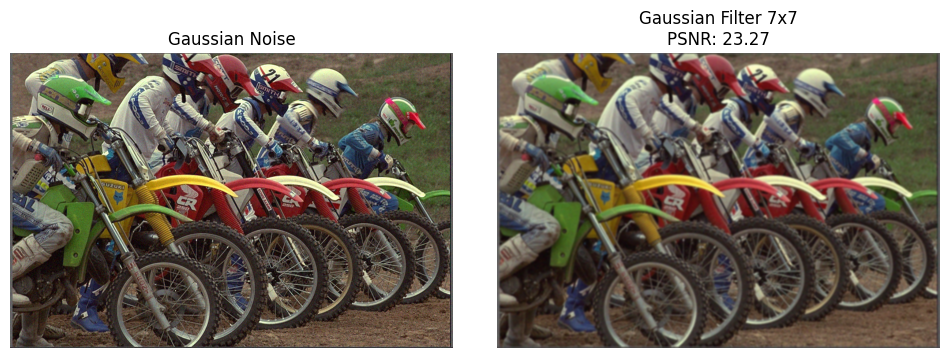

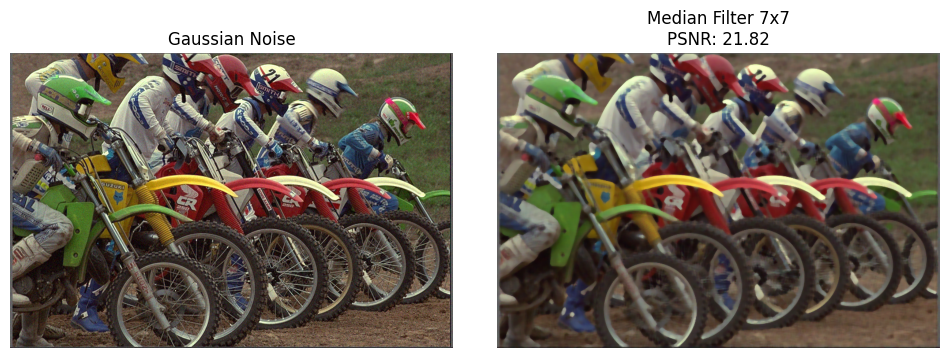

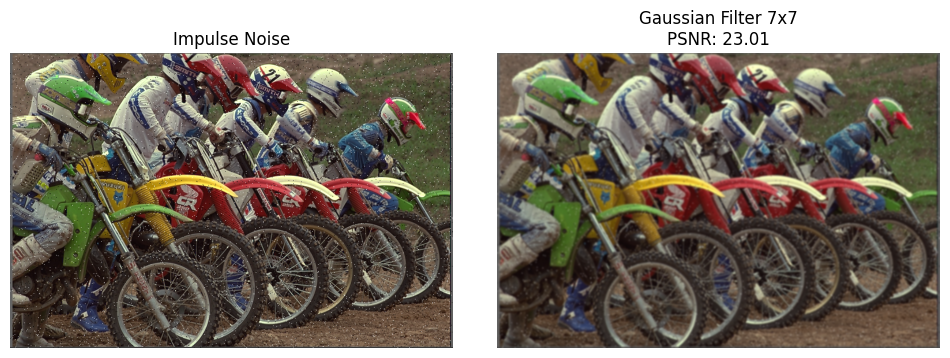

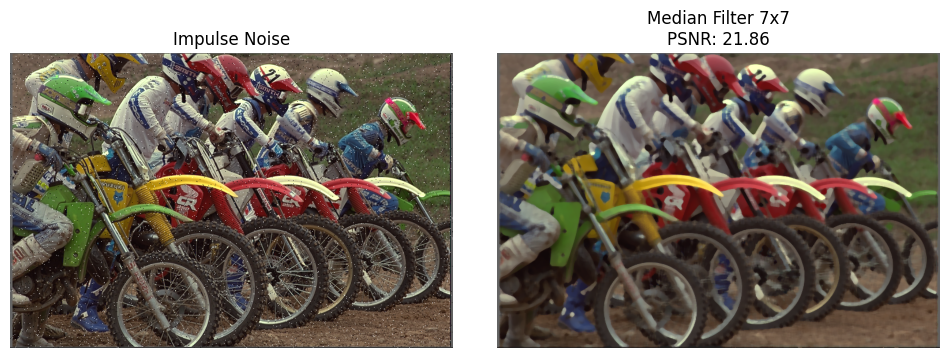

,Noise,Filter,Kernel Size,PSNR
0,Gaussian Noise,Gaussian Filter,3x3,27.410793
1,Gaussian Noise,Median Filter,3x3,26.830133
2,Impulse Noise,Gaussian Filter,3x3,25.859112
3,Impulse Noise,Median Filter,3x3,27.288388
4,Gaussian Noise,Gaussian Filter,5x5,25.052023
5,Gaussian Noise,Median Filter,5x5,23.233747
6,Impulse Noise,Gaussian Filter,5x5,24.461200
7,Impulse Noise,Median Filter,5x5,23.321736
8,Gaussian Noise,Gaussian Filter,7x7,23.271935
9,Gaussian Noise,Median Filter,7x7,21.820245


In [62]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Funkcje do wczytywania obrazów oraz przeprowadzania filtracji
def readImages():
    # Wczytywanie obrazów: oryginalnego, z szumem gaussowskim i z szumem impulsowym.
    original_image = cv2.imread(r'..\LAB_4\obrazy_testowe\color\bikes_col.png', cv2.IMREAD_UNCHANGED)
    gaussian_noise_image = cv2.imread(r'..\LAB_4\obrazy_testowe\color_noise\bikes_col_noise.png', cv2.IMREAD_UNCHANGED)
    impulse_noise_image = cv2.imread(r'..\LAB_4\obrazy_testowe\color_inoise1\bikes_col_inoise.png', cv2.IMREAD_UNCHANGED)
    return original_image, gaussian_noise_image, impulse_noise_image

# Filtr gaussowski
def gaussianFilter(image, kernel_size):
    # Zastosowanie filtru gaussowskiego z określonym rozmiarem jądra (kernel_size).
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

# Filtr medianowy
def medianFilter(image, kernel_size):
    # Zastosowanie filtru medianowego z określonym rozmiarem jądra.
    return cv2.medianBlur(image, kernel_size)

# Obliczanie PSNR (Peak Signal-to-Noise Ratio)
def calcPSNR(img1, img2):
    # Obliczenie maksymalnej możliwej wartości piksela.
    imax = 255.**2  
    # Obliczenie średniego błędu kwadratowego między dwoma obrazami.
    mse = ((img1.astype(np.float64)-img2)**2).sum()/img1.size 
    # Zwrócenie wartości PSNR.
    return 10.0*np.log10(imax/mse)

# Wczytanie obrazów
images = readImages()
kernel_sizes = [3, 5, 7]  # Definiowanie rozmiarów jąder do testowania
psnr_results = []  # Lista do przechowywania wyników

# Pętla iterująca przez różne rozmiary jąder i typy filtrów
for kernel_size in kernel_sizes:
    for noise_image, noise_label in zip(images[1:], ['Gaussian Noise', 'Impulse Noise']):
        for filter_func, filter_name in [(gaussianFilter, 'Gaussian Filter'), (medianFilter, 'Median Filter')]:
            # Filtracja obrazu zaszumionego
            filtered_image = filter_func(noise_image, kernel_size)
            # Obliczenie PSNR dla oryginalnego i przefiltrowanego obrazu
            psnr = calcPSNR(images[0], filtered_image)
            # Zapisanie wyników do listy
            psnr_results.append({
                'Noise': noise_label, 
                'Filter': filter_name, 
                'Kernel Size': f'{kernel_size}x{kernel_size}', 
                'PSNR': psnr
            })
            
            # Wyświetlenie obrazów przed i po filtracji
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(noise_image, cv2.COLOR_BGR2RGB))
            plt.title(noise_label)
            plt.axis('off')

            plt.subplot(1, 2, 2)
            plt.imshow(cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB))
            plt.title(f"{filter_name} {kernel_size}x{kernel_size}\nPSNR: {psnr:.2f}")
            plt.axis('off')

            plt.subplots_adjust(wspace=0.1, hspace=0)
            plt.show()

# Wyświetlenie tabeli z wynikami PSNR dla wszystkich przeprowadzonych filtracji
psnr_df = pd.DataFrame(psnr_results)
display(psnr_df)


### Jaki wpływ na skuteczność filtracji i na zniekształcenie obrazu ma rozmiar maski filtru?

Rozmiar maski filtru bezpośrednio wpływa na skuteczność filtracji – większe maski efektywniej usuwają szum, lecz jednocześnie wprowadzają większe zniekształcenie w postaci rozmycia obrazu. Zastosowanie większych masek prowadzi do bardziej zauważalnego zmniejszenia detali i ogólnej ostrości obrazu, co jest widoczne zwłaszcza przy użyciu filtru medianowego na szumie impulsowym. W przypadku filtru gaussowskiego, który jest stosowany do szumu gaussowskiego, również obserwuje się zwiększone rozmycie w miarę zwiększania rozmiaru maski, choć efekt ten może być mniej zauważalny z uwagi na charakterystykę samego szumu.

###  Czy ocena subiektywna uzyskanych obrazów wynikowych, jest zgodna z PSNR (lepsza jakość – większy PSNR)?

Analizując otrzymane wyniki, subiektywna ocena jakości obrazów po filtracji jest zgodna z wartościami PSNR, które sugerują zasadę "lepsza jakość = większy PSNR". W przypadkach, kiedy PSNR jest wyższy, obrazy subiektywnie wydają się być lepszej jakości, co potwierdza teorię o korelacji między PSNR a percepcją jakości obrazu. Przyjmując to założenie, można stwierdzić, że filtr medianowy, generując wyższe wartości PSNR dla szumu impulsowego przy mniejszym rozmiarze maski, lepiej radzi sobie z poprawą jakości obrazów wizualnie. Podobnie, wyższy PSNR dla filtru gaussowskiego w stosunku do szumu gaussowskiego przy mniejszych maskach wskazuje na lepszą jakość obrazów po filtracji.

## Zad. 2

Zrealizować operację wyrównania histogramu dla obrazu barwnego i zapisać obraz wynikowy do
pliku. UWAGA: operację wyrównania histogramu należy wykonać wyłącznie dla składowej
odpowiadającej za jasność, w tym celu należy wejściowy obraz RGB skonwertować do innej
przestrzeni (np. YCbCr/YUV), a po wyrównaniu histogramu dla właściwej składowej powrócić do
pierwotnego formatu.
Porównać uzyskane obrazy i ich histogramy (w szczególności: histogram dla składowej, dla której
wykonano operację wyrównywania histogramu).


### Czy obraz po wyrównaniu histogramu jest subiektywnie lepszej jakości?